In [ ]:
!pip install --upgrade numpy ultralytics roboflow opencv-python-headless

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.1/62.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 45.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 72.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.3/65.3 kB 6.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.1.3
    Uninstalling numpy-2.1.3:
      Successfully uninstalled numpy-2.1.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.61.2 requires numpy<2.3,>=1.24, but you have numpy 2.3.5 which is incompatible.


In [ ]:
# 1st Section: Setup
!nvidia-smi

import os
HOME = os.getcwd()

# Install dependencies
!pip install ultralytics==8.2.103 -q
!pip install roboflow -q

from IPython import display
display.clear_output()

# Configure environment
!yolo settings sync=False
import ultralytics
ultralytics.checks()

from ultralytics import YOLO
from IPython.display import display, Image
from roboflow import Roboflow

Ultralytics YOLOv8.2.103 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 47.8/112.6 GB disk)


# Import Dataset


In [ ]:
# 1280x720


from roboflow import Roboflow
rf = Roboflow(api_key="YOUR_ACTUAL_KEY")
project = rf.workspace("nurs-workspace-uplim").project("wound-cw2to")
version = project.version(4)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to wound-4 in yolov8:: 100%|██████████| 3021/3021 [00:00<00:00, 3318.08it/s]


In [ ]:
import os

# Get the directory where Roboflow downloaded your YOLOv8 dataset
dataset_path = dataset.location

# Construct the full path to data.yaml
yaml_path = os.path.join(dataset_path, "data.yaml")

# Open and print the contents of the file
with open(yaml_path, "r") as file:
    print(file.read())

names:
- mild
- normal
- severe
nc: 3
roboflow:
  license: CC BY 4.0
  project: wound-cw2to
  url: https://universe.roboflow.com/nurs-workspace-uplim/wound-cw2to/dataset/4
  version: 4
  workspace: nurs-workspace-uplim
test: ../test/images
train: ../train/images
val: ../valid/images



In [ ]:
import os, yaml

with open(os.path.join(dataset.location, "data.yaml")) as f:
    classes = yaml.safe_load(f)["names"]

class_images = {i: set() for i in range(len(classes))}

for split in ["train", "valid", "test"]:
    lbl_dir = os.path.join(dataset.location, split, "labels")
    img_dir = os.path.join(dataset.location, split, "images")
    if os.path.exists(lbl_dir):
        for file in os.listdir(lbl_dir):
            if file.endswith(".txt"):
                img_name = file.rsplit(".", 1)[0]
                with open(os.path.join(lbl_dir, file)) as lf:
                    for line in lf:
                        cid = int(line.split()[0])
                        class_images[cid].add(img_name)

print("Total Unique Images per Class:")
for i, name in enumerate(classes):
    print(f"  - {name}: {len(class_images[i])} images")

Total Unique Images per Class:
  - mild: 600 images
  - normal: 600 images
  - severe: 600 images


# Augment data

In [ ]:
# Balance Dataset to 600 images for Normal class

import os
import yaml
import cv2
import random

dataset_path = dataset.location
with open(os.path.join(dataset_path, "data.yaml")) as f:
    data = yaml.safe_load(f)

classes = data["names"]
normal_id = classes.index('normal') if isinstance(classes, list) else [k for k, v in classes.items() if v == 'normal'][0]

train_img_dir = os.path.join(dataset_path, "train/images")
train_lbl_dir = os.path.join(dataset_path, "train/labels")

# 1. Clean up any previous 'aug_' files to start fresh
for f in os.listdir(train_img_dir):
    if f.startswith("aug_"):
        os.remove(os.path.join(train_img_dir, f))
for f in os.listdir(train_lbl_dir):
    if f.startswith("aug_"):
        os.remove(os.path.join(train_lbl_dir, f))

# 2. Find all training images containing the 'normal' class across the whole dataset (or count train normal specifically)
# Let's count how many normal images are currently in the ENTIRE dataset to see how many we need to reach 600 total.
current_normal_images = set()
for split in ["train", "valid", "test"]:
    lbl_dir = os.path.join(dataset_path, split, "labels")
    if os.path.exists(lbl_dir):
        for file in os.listdir(lbl_dir):
            if file.endswith(".txt"):
                with open(os.path.join(lbl_dir, file), 'r') as lf:
                    for line in lf:
                        parts = line.strip().split()
                        if parts and int(parts[0]) == normal_id:
                            current_normal_images.add(file.rsplit(".", 1)[0])

current_total = len(current_normal_images)
target_total = 600
needed = target_total - current_total

print(f"Current total 'normal' images across dataset: {current_total}")
print(f"Exact number of augmentations needed to reach {target_total}: {max(0, needed)}")

if needed > 0:
    # Get the list of original training normal files to use as sources for augmentation
    train_normal_files = []
    for file in os.listdir(train_lbl_dir):
        if file.endswith(".txt") and not file.startswith("aug_"):
            file_path = os.path.join(train_lbl_dir, file)
            with open(file_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if parts and int(parts[0]) == normal_id:
                        img_name = file.replace('.txt', '.jpg')
                        if not os.path.exists(os.path.join(train_img_dir, img_name)):
                            img_name = file.replace('.txt', '.png')
                        train_normal_files.append((img_name, file, lines))
                        break

    augmented_count = 0
    while augmented_count < needed and train_normal_files:
        img_name, lbl_name, lines = random.choice(train_normal_files)

        ext = os.path.splitext(img_name)[1]
        base_name = os.path.splitext(img_name)[0]

        img_path = os.path.join(train_img_dir, img_name)
        if not os.path.exists(img_path):
            continue

        img = cv2.imread(img_path)
        if img is None:
            continue

        # Apply horizontal flip augmentation
        aug_img = cv2.flip(img, 1)

        new_id = f"aug_{augmented_count}_{base_name}{ext}"
        new_lbl_name = f"aug_{augmented_count}_{base_name}.txt"

        # Save ONLY to training folders
        cv2.imwrite(os.path.join(train_img_dir, new_id), aug_img)

        # Adjust bounding boxes for horizontal flip
        new_lines = []
        for line in lines:
            parts = line.strip().split()
            if parts:
                cid = parts[0]
                x_center = 1.0 - float(parts[1])
                y_center = parts[2]
                w = parts[3]
                h = parts[4]
                new_lines.append(f"{cid} {x_center} {y_center} {w} {h}\n")

        with open(os.path.join(train_lbl_dir, new_lbl_name), 'w') as lf:
            lf.writelines(new_lines)

        augmented_count += 1

    print(f"Successfully added exactly {augmented_count} augmented images to training!")
else:
    print("Normal class is already at or above 600.")

Current total 'normal' images across dataset: 302
Exact number of augmentations needed to reach 600: 298
Successfully added exactly 298 augmented images to training!


In [ ]:
# PRECISELY BALANCE NORMAL CLASS WITH POLYGON-AWARE AUGMENTATION

import os
import yaml
import cv2
import random

dataset_path = dataset.location
with open(os.path.join(dataset_path, "data.yaml")) as f:
    data = yaml.safe_load(f)

classes = data["names"]
normal_id = classes.index('normal') if isinstance(classes, list) else [k for k, v in classes.items() if v == 'normal'][0]

train_img_dir = os.path.join(dataset_path, "train/images")
train_lbl_dir = os.path.join(dataset_path, "train/labels")

# 1. Clean up any previous 'aug_' files to start fresh
for f in os.listdir(train_img_dir):
    if f.startswith("aug_"):
        os.remove(os.path.join(train_img_dir, f))
for f in os.listdir(train_lbl_dir):
    if f.startswith("aug_"):
        os.remove(os.path.join(train_lbl_dir, f))

# 2. Find all normal images across the dataset to check counts
current_normal_images = set()
for split in ["train", "valid", "test"]:
    lbl_dir = os.path.join(dataset_path, split, "labels")
    if os.path.exists(lbl_dir):
        for file in os.listdir(lbl_dir):
            if file.endswith(".txt"):
                with open(os.path.join(lbl_dir, file), 'r') as lf:
                    for line in lf:
                        parts = line.strip().split()
                        if parts and int(parts[0]) == normal_id:
                            current_normal_images.add(file.rsplit(".", 1)[0])

current_total = len(current_normal_images)
target_total = 600
needed = target_total - current_total

print(f"Current total 'normal' images across dataset: {current_total}")
print(f"Exact number of augmentations needed to reach {target_total}: {max(0, needed)}")

if needed > 0:
    train_normal_files = []
    for file in os.listdir(train_lbl_dir):
        if file.endswith(".txt") and not file.startswith("aug_"):
            file_path = os.path.join(train_lbl_dir, file)
            with open(file_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    if parts and int(parts[0]) == normal_id:
                        img_name = file.replace('.txt', '.jpg')
                        if not os.path.exists(os.path.join(train_img_dir, img_name)):
                            img_name = file.replace('.txt', '.png')
                        train_normal_files.append((img_name, file, lines))
                        break

    augmented_count = 0
    while augmented_count < needed and train_normal_files:
        img_name, lbl_name, lines = random.choice(train_normal_files)

        ext = os.path.splitext(img_name)[1]
        base_name = os.path.splitext(img_name)[0]

        img_path = os.path.join(train_img_dir, img_name)
        if not os.path.exists(img_path):
            continue

        img = cv2.imread(img_path)
        if img is None:
            continue

        # Apply horizontal flip augmentation to image
        aug_img = cv2.flip(img, 1)

        new_id = f"aug_{augmented_count}_{base_name}{ext}"
        new_lbl_name = f"aug_{augmented_count}_{base_name}.txt"

        cv2.imwrite(os.path.join(train_img_dir, new_id), aug_img)

        # Adjust polygon mask coordinates for horizontal flip (x becomes 1.0 - x)
        new_lines = []
        for line in lines:
            parts = line.strip().split()
            if not parts:
                continue

            cid = parts[0]
            coords = [float(p) for p in parts[1:]]

            # Check if it's a polygon (more than 4 coordinate values, i.e., x1, y1, x2, y2, ...)
            if len(coords) > 4:
                new_coords = []
                for i in range(0, len(coords), 2):
                    x_flipped = 1.0 - coords[i]
                    y_coord = coords[i+1]
                    new_coords.extend([x_flipped, y_coord])

                poly_str = " ".join([f"{val:.6f}" for val in new_coords])
                new_lines.append(f"{cid} {poly_str}\n")
            else:
                # Fallback safety if any old 4-value box slips through
                x_center = 1.0 - coords[0]
                y_center, w, h = coords[1], coords[2], coords[3]
                new_lines.append(f"{cid} {x_center} {y_center} {w} {h}\n")

        with open(os.path.join(train_lbl_dir, new_lbl_name), 'w') as lf:
            lf.writelines(new_lines)

        augmented_count += 1

    print(f"Successfully added exactly {augmented_count} polygon-augmented images to training!")
else:
    print("Normal class is already at or above 600.")

Current total 'normal' images across dataset: 302
Exact number of augmentations needed to reach 600: 298
Successfully added exactly 298 polygon-augmented images to training!


In [ ]:
# CHECK UPDATED TOTAL UNIQUE IMAGES PER CLASS

import os, yaml

with open(os.path.join(dataset.location, "data.yaml")) as f:
    classes = yaml.safe_load(f)["names"]

class_images = {i: set() for i in range(len(classes))}

for split in ["train", "valid", "test"]:
    lbl_dir = os.path.join(dataset.location, split, "labels")
    if os.path.exists(lbl_dir):
        for file in os.listdir(lbl_dir):
            if file.endswith(".txt"):
                img_name = file.rsplit(".", 1)[0]
                with open(os.path.join(lbl_dir, file)) as lf:
                    for line in lf:
                        cid = int(line.split()[0])
                        class_images[cid].add(img_name)

print("Updated Total Unique Images per Class:")
for i, name in enumerate(classes):
    print(f"  - {name}: {len(class_images[i])} images")

Updated Total Unique Images per Class:
  - mild: 600 images
  - normal: 600 images
  - severe: 600 images


# Training wth YOLOV8-seg model



In [ ]:

from ultralytics import YOLO

# Load the YOLOv8s-seg model
model = YOLO('yolov8s-seg.pt')

# Train using your exact multi-line parameters
model.train(
    data=f'{dataset.location}/data.yaml',
    epochs=50,
    imgsz=640,
    batch=4,
    optimizer='SGD',
    lr0=0.01,
    amp=True,
    val=True,
    project='runs/segment',
    name='original_yolov8s_seg',
)

New https://pypi.org/project/ultralytics/8.4.123 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/wound-4/data.yaml, epochs=100, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=runs/segment, name=original_yolov8s_seg5, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, 

train: Scanning /content/wound-4/train/labels... 1504 images, 4 backgrounds, 0 corrupt: 100%|██████████| 1504/1504 [00:00<00:00, 1810.93it/s]

train: New cache created: /content/wound-4/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression
val: Scanning /content/wound-4/valid/labels... 151 images, 1 backgrounds, 0 corrupt: 100%|██████████| 151/151 [00:00<00:00, 754.34it/s]

val: New cache created: /content/wound-4/valid/labels.cache


Plotting labels to runs/segment/original_yolov8s_seg5/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/original_yolov8s_seg5
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.51G     0.9478      1.764      1.477      1.269          9        640: 100%|██████████| 376/376 [01:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  8.06it/s]

                   all        151        153      0.983      0.981      0.978      0.803      0.983      0.981      0.978      0.798



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/100      1.44G     0.8107      1.274     0.6739      1.124          9        640: 100%|██████████| 376/376 [00:53<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.65it/s]


                   all        151        153      0.978      0.837      0.931      0.755      0.978      0.837      0.923      0.723

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.44G     0.8142      1.242     0.6859      1.113         11        640: 100%|██████████| 376/376 [00:53<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  8.17it/s]

                   all        151        153      0.983      0.981      0.978      0.771      0.983      0.981      0.978      0.775



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.43G     0.8532      1.309      0.715      1.142          9        640: 100%|██████████| 376/376 [00:53<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.19it/s]

                   all        151        153      0.976       0.96      0.986      0.784      0.976       0.96      0.986      0.793



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.44G     0.8463       1.27     0.6531       1.13          6        640: 100%|██████████| 376/376 [01:02<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  7.41it/s]

                   all        151        153       0.98      0.978      0.982      0.802       0.98      0.978      0.982      0.803



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.44G      0.834       1.23     0.6105      1.136         11        640: 100%|██████████| 376/376 [00:55<00:00,  6.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.05it/s]

                   all        151        153       0.98      0.981      0.986      0.812       0.98      0.981      0.984      0.812



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.44G     0.8167      1.207       0.58      1.114         10        640: 100%|██████████| 376/376 [00:54<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  7.57it/s]

                   all        151        153      0.983      0.981      0.984      0.824      0.983      0.981      0.984      0.816



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.42G     0.8196      1.175     0.5808      1.117         11        640: 100%|██████████| 376/376 [00:53<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  8.88it/s]


                   all        151        153      0.983      0.981      0.989      0.831      0.983      0.981      0.989      0.834

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.44G     0.7972      1.204     0.5647      1.104          8        640: 100%|██████████| 376/376 [00:53<00:00,  7.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.36it/s]


                   all        151        153      0.985      0.977      0.983      0.813      0.985      0.977      0.983      0.806

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.42G     0.8134      1.208     0.5708      1.129         14        640: 100%|██████████| 376/376 [00:53<00:00,  7.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.28it/s]

                   all        151        153      0.984       0.98      0.984       0.81      0.984       0.98      0.984      0.803



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.43G     0.7788      1.157     0.5321      1.095         12        640: 100%|██████████| 376/376 [00:53<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.26it/s]

                   all        151        153      0.983       0.98      0.987      0.835      0.983       0.98      0.987      0.833



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.44G     0.7719      1.139     0.5298      1.091         14        640: 100%|██████████| 376/376 [00:53<00:00,  7.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.10it/s]


                   all        151        153      0.979       0.95       0.96      0.805      0.979       0.95       0.96      0.779

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.43G     0.7716      1.154     0.5357      1.089         11        640: 100%|██████████| 376/376 [00:53<00:00,  7.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:03<00:00,  6.23it/s]


                   all        151        153      0.985      0.979      0.986      0.833      0.985      0.979      0.986      0.828

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.43G     0.7547       1.14     0.5071       1.08          6        640: 100%|██████████| 376/376 [00:53<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.92it/s]

                   all        151        153      0.986      0.981      0.985      0.831      0.986      0.981      0.985      0.822



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.43G     0.7579      1.098      0.504       1.08          7        640: 100%|██████████| 376/376 [00:53<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.00it/s]

                   all        151        153      0.978      0.981      0.989      0.849      0.978      0.981      0.989      0.842



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.43G     0.7564      1.111     0.4886      1.078         10        640: 100%|██████████| 376/376 [00:53<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.02it/s]

                   all        151        153      0.981      0.979      0.988      0.825      0.981      0.979       0.99      0.816



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.43G     0.7387      1.108     0.4878      1.076         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.28it/s]

                   all        151        153      0.984      0.976       0.99      0.829      0.984      0.976       0.99      0.824



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.43G     0.7375      1.074     0.4922       1.08         12        640: 100%|██████████| 376/376 [00:53<00:00,  7.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.92it/s]

                   all        151        153      0.983      0.979      0.989       0.85      0.983      0.979      0.989      0.836



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.43G     0.7238      1.053     0.4737       1.06         10        640: 100%|██████████| 376/376 [00:52<00:00,  7.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  8.66it/s]

                   all        151        153      0.983      0.975      0.988      0.848      0.983      0.975      0.988      0.835



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.42G     0.7084      1.044     0.4524      1.061         16        640: 100%|██████████| 376/376 [00:53<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.41it/s]

                   all        151        153      0.986      0.979      0.978      0.848      0.986      0.979      0.978      0.844



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.42G     0.7064       1.03     0.4505      1.055          7        640: 100%|██████████| 376/376 [00:53<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.05it/s]

                   all        151        153      0.989      0.966      0.987      0.827      0.989      0.966      0.987      0.824



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.44G     0.7066       1.06     0.4553      1.053          9        640: 100%|██████████| 376/376 [00:55<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.78it/s]


                   all        151        153      0.989       0.97      0.986      0.831      0.989       0.97      0.986      0.823

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.43G     0.7023       1.05     0.4507      1.053          7        640: 100%|██████████| 376/376 [00:53<00:00,  6.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  7.04it/s]

                   all        151        153      0.976      0.978      0.981      0.836      0.976      0.978      0.981       0.83



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.44G     0.6949      1.046     0.4421      1.046         13        640: 100%|██████████| 376/376 [00:53<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.14it/s]

                   all        151        153      0.991      0.974      0.986      0.851      0.991      0.974      0.986      0.849



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.42G     0.7045      1.042     0.4641      1.054         12        640: 100%|██████████| 376/376 [00:54<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.89it/s]

                   all        151        153       0.99      0.966      0.985      0.849       0.99      0.966      0.985      0.837



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.43G     0.6953      1.034     0.4476      1.057          6        640: 100%|██████████| 376/376 [00:53<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.06it/s]

                   all        151        153      0.982       0.98      0.986      0.858      0.982       0.98      0.986      0.853



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.42G     0.6892      1.037     0.4351      1.048         14        640: 100%|██████████| 376/376 [00:53<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.66it/s]

                   all        151        153      0.982      0.977      0.983      0.839      0.982      0.977      0.983      0.838



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/100      1.44G     0.6855      1.032     0.4334      1.052         11        640: 100%|██████████| 376/376 [00:54<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  8.07it/s]

                   all        151        153      0.983      0.979      0.985      0.851      0.983      0.979      0.985      0.836



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.42G     0.6741       1.01     0.4348      1.038         12        640: 100%|██████████| 376/376 [00:53<00:00,  6.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.07it/s]

                   all        151        153      0.983       0.98      0.985      0.863      0.983       0.98      0.985      0.848



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.43G     0.6706     0.9929     0.4079      1.043         11        640: 100%|██████████| 376/376 [00:53<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.04it/s]

                   all        151        153      0.981      0.979      0.988      0.861      0.981      0.979      0.988      0.842



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/100      1.42G     0.6626     0.9983     0.4149      1.033         12        640: 100%|██████████| 376/376 [00:53<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.09it/s]

                   all        151        153      0.982       0.98      0.983      0.869      0.982       0.98      0.983      0.856



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/100      1.44G     0.6581     0.9888     0.4057      1.023          9        640: 100%|██████████| 376/376 [00:54<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  8.15it/s]

                   all        151        153      0.984       0.98      0.983       0.86      0.984       0.98      0.983      0.853



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.42G     0.6544     0.9679     0.4032      1.027         10        640: 100%|██████████| 376/376 [00:53<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  8.04it/s]


                   all        151        153      0.983      0.977      0.985      0.866      0.983      0.977      0.986      0.843

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/100      1.44G     0.6652      1.015     0.4223       1.04         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.41it/s]


                   all        151        153      0.983      0.976      0.983      0.859      0.983      0.976      0.983      0.846

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/100      1.44G     0.6484     0.9795     0.4159      1.028          7        640: 100%|██████████| 376/376 [00:53<00:00,  7.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.15it/s]

                   all        151        153      0.984      0.976      0.986      0.851      0.984      0.976      0.986      0.841



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.43G     0.6411     0.9955     0.4084      1.026         14        640: 100%|██████████| 376/376 [00:53<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.13it/s]


                   all        151        153      0.986      0.976      0.984      0.853      0.986      0.976      0.984      0.843

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/100      1.43G     0.6603      1.004     0.4116      1.039         10        640: 100%|██████████| 376/376 [00:53<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  9.28it/s]

                   all        151        153      0.985       0.98      0.985      0.867      0.985       0.98      0.985      0.846



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/100      1.42G     0.6375     0.9628     0.3893      1.018          7        640: 100%|██████████| 376/376 [00:53<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  7.53it/s]

                   all        151        153      0.982       0.98      0.985      0.867      0.982       0.98      0.985      0.844



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/100      1.44G     0.6318     0.9549     0.3938      1.014          9        640: 100%|██████████| 376/376 [00:53<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.18it/s]

                   all        151        153      0.979       0.98      0.982      0.851      0.979       0.98      0.982       0.84



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/100      1.44G     0.6281     0.9564      0.386      1.019          5        640: 100%|██████████| 376/376 [00:53<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.86it/s]

                   all        151        153      0.982       0.98      0.984      0.872      0.982       0.98      0.985      0.855



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/100      1.42G     0.6295      0.941     0.3827      1.014          7        640: 100%|██████████| 376/376 [00:53<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.29it/s]

                   all        151        153      0.982      0.977      0.986      0.867      0.982      0.977      0.986       0.86



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/100      1.42G     0.6296     0.9296     0.3804      1.013          9        640: 100%|██████████| 376/376 [00:54<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.97it/s]

                   all        151        153      0.981       0.98      0.983      0.857      0.981       0.98      0.984      0.845



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/100      1.43G     0.6137     0.9443      0.374      1.008          9        640: 100%|██████████| 376/376 [00:54<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.52it/s]

                   all        151        153      0.976       0.98      0.984      0.857      0.976       0.98      0.984      0.846



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/100      1.42G     0.6341     0.9597     0.3877       1.02         11        640: 100%|██████████| 376/376 [00:57<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.57it/s]

                   all        151        153      0.981      0.981      0.984      0.864      0.981      0.981      0.984      0.859



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.44G     0.6108     0.9323     0.3752          1          9        640: 100%|██████████| 376/376 [00:55<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.06it/s]

                   all        151        153      0.983       0.98      0.986      0.879      0.983       0.98      0.986      0.871



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.43G     0.6169     0.9373     0.3692      1.011         10        640: 100%|██████████| 376/376 [00:55<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.44it/s]

                   all        151        153      0.984       0.98      0.984      0.873      0.984       0.98      0.984      0.851



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.44G     0.6043     0.9001     0.3683      1.004         10        640: 100%|██████████| 376/376 [00:55<00:00,  6.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.90it/s]

                   all        151        153      0.984      0.974      0.985      0.875      0.984      0.974      0.985      0.858



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.42G     0.6058     0.9071     0.3621      1.001          8        640: 100%|██████████| 376/376 [00:53<00:00,  6.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.91it/s]

                   all        151        153      0.979      0.979      0.982      0.865      0.979      0.979      0.982      0.856



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.44G     0.5976     0.9269     0.3581      1.001         13        640: 100%|██████████| 376/376 [00:54<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.00it/s]

                   all        151        153       0.99      0.966      0.983      0.879       0.99      0.966      0.983      0.857



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/100      1.44G     0.5889     0.9142     0.3509          1          7        640: 100%|██████████| 376/376 [00:54<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.06it/s]

                   all        151        153      0.985      0.976      0.985      0.873      0.985      0.976      0.985      0.857



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.44G     0.6118     0.9337     0.3742      1.009         13        640: 100%|██████████| 376/376 [00:54<00:00,  6.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:03<00:00,  6.16it/s]

                   all        151        153      0.982      0.979      0.987      0.877      0.982      0.979      0.987      0.866



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.44G     0.6021     0.9118     0.3633       1.01         11        640: 100%|██████████| 376/376 [00:53<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.11it/s]

                   all        151        153       0.98      0.976      0.986      0.875       0.98      0.976      0.986      0.858



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.44G     0.5865     0.8809     0.3439     0.9946          7        640: 100%|██████████| 376/376 [00:53<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.46it/s]

                   all        151        153      0.981       0.98      0.984      0.873      0.981       0.98      0.984      0.855



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.43G     0.5887     0.8957     0.3529      1.003         12        640: 100%|██████████| 376/376 [00:53<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.33it/s]

                   all        151        153      0.992      0.966      0.985      0.865      0.992      0.966      0.985      0.854



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.44G     0.5962     0.8997     0.3475     0.9954         10        640: 100%|██████████| 376/376 [00:54<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.87it/s]

                   all        151        153      0.981      0.981      0.981      0.871      0.981      0.981      0.981      0.863



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/100      1.44G     0.5726     0.8698     0.3465     0.9842          6        640: 100%|██████████| 376/376 [00:53<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  7.45it/s]

                   all        151        153       0.99      0.966      0.982      0.862       0.99      0.966      0.982      0.859



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/100      1.44G     0.5687     0.8894     0.3408     0.9953         15        640: 100%|██████████| 376/376 [00:54<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.29it/s]


                   all        151        153      0.981      0.976      0.985      0.876      0.981      0.976      0.985      0.861

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/100      1.42G     0.5754     0.8942      0.341     0.9927         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.37it/s]

                   all        151        153      0.991      0.966      0.981      0.866      0.991      0.966      0.981      0.856



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/100      1.44G     0.5777     0.8938     0.3398     0.9818         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.28it/s]

                   all        151        153      0.979       0.98      0.985       0.88      0.979       0.98      0.986      0.863



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/100      1.44G     0.5638     0.8557     0.3303     0.9846         11        640: 100%|██████████| 376/376 [00:53<00:00,  7.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.47it/s]

                   all        151        153      0.982       0.98      0.983      0.872      0.982       0.98      0.983      0.858



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.44G     0.5619     0.8759     0.3296     0.9856         12        640: 100%|██████████| 376/376 [00:53<00:00,  7.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.07it/s]

                   all        151        153      0.981      0.979       0.98      0.871      0.981      0.979      0.982      0.866



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/100      1.43G     0.5671     0.8815     0.3385     0.9842         12        640: 100%|██████████| 376/376 [00:53<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.63it/s]

                   all        151        153      0.974      0.977      0.984      0.873      0.974      0.977      0.984      0.859



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/100      1.44G     0.5625     0.8668     0.3335     0.9835         11        640: 100%|██████████| 376/376 [00:53<00:00,  7.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.30it/s]

                   all        151        153      0.981      0.979      0.983      0.853      0.981      0.979      0.983      0.843



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/100      1.43G     0.5627     0.8673     0.3359     0.9843         10        640: 100%|██████████| 376/376 [00:53<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.09it/s]

                   all        151        153      0.983      0.976      0.981      0.864      0.983      0.976      0.981      0.859



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/100      1.42G     0.5543     0.8563     0.3277     0.9874          6        640: 100%|██████████| 376/376 [00:54<00:00,  6.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.74it/s]


                   all        151        153      0.983      0.976      0.981      0.879      0.983      0.976      0.981      0.864

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/100      1.42G     0.5513     0.8647     0.3259     0.9741          5        640: 100%|██████████| 376/376 [00:54<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  9.42it/s]

                   all        151        153      0.983       0.98      0.984       0.87      0.983       0.98      0.984      0.861



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/100      1.43G      0.547     0.8568     0.3246     0.9788         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:03<00:00,  6.20it/s]

                   all        151        153      0.983      0.976      0.983      0.876      0.983      0.976      0.983      0.868



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/100      1.44G     0.5506     0.8402     0.3205     0.9752         10        640: 100%|██████████| 376/376 [00:54<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.23it/s]


                   all        151        153      0.981      0.976      0.982      0.874      0.981      0.976      0.982      0.864

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/100      1.42G     0.5482     0.8436       0.32      0.967          9        640: 100%|██████████| 376/376 [00:53<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.41it/s]

                   all        151        153      0.979      0.979      0.982      0.869      0.979      0.979      0.982      0.857



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/100      1.43G     0.5343     0.8257     0.3068     0.9705         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.36it/s]

                   all        151        153      0.982       0.98      0.984      0.875      0.982       0.98      0.984      0.867



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.43G     0.5307     0.8287     0.3078     0.9696         16        640: 100%|██████████| 376/376 [00:54<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.13it/s]

                   all        151        153       0.99      0.966      0.984      0.873       0.99      0.966      0.985      0.866



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/100      1.42G     0.5212     0.8233     0.3081     0.9623          8        640: 100%|██████████| 376/376 [00:54<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.34it/s]

                   all        151        153      0.977      0.976      0.983      0.875      0.977      0.976      0.983       0.87



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/100      1.42G     0.5306      0.837     0.3072     0.9632         14        640: 100%|██████████| 376/376 [00:54<00:00,  6.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.38it/s]

                   all        151        153      0.987      0.967      0.984      0.886      0.987      0.967      0.984      0.863



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/100      1.44G      0.524     0.8072     0.3055     0.9707         12        640: 100%|██████████| 376/376 [00:53<00:00,  6.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.99it/s]

                   all        151        153      0.982      0.976      0.983      0.872      0.982      0.976      0.983      0.857



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/100      1.43G     0.5357     0.8297     0.3175     0.9707          8        640: 100%|██████████| 376/376 [00:54<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.17it/s]

                   all        151        153      0.981      0.972      0.983      0.876      0.981      0.972      0.983      0.868



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.43G     0.5194     0.8143      0.308     0.9635         12        640: 100%|██████████| 376/376 [00:53<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  7.32it/s]


                   all        151        153      0.988      0.966      0.983      0.869      0.988      0.966      0.983      0.861

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/100      1.44G     0.5186     0.7973     0.3007     0.9634         10        640: 100%|██████████| 376/376 [00:53<00:00,  6.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.55it/s]

                   all        151        153      0.986      0.966      0.982      0.882      0.986      0.966      0.982      0.864



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.44G     0.5078     0.7924     0.2994     0.9495         10        640: 100%|██████████| 376/376 [00:54<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.93it/s]

                   all        151        153      0.975      0.976      0.982      0.875      0.975      0.976      0.982      0.867



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/100      1.44G     0.5256     0.8156     0.3028     0.9678         11        640: 100%|██████████| 376/376 [00:53<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.40it/s]

                   all        151        153      0.983      0.976      0.982      0.876      0.983      0.976      0.983       0.87



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/100      1.42G     0.5069     0.7971     0.2862     0.9582          7        640: 100%|██████████| 376/376 [00:54<00:00,  6.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.22it/s]

                   all        151        153      0.981       0.98      0.982      0.877      0.981       0.98      0.982      0.862



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/100      1.43G      0.511     0.7915     0.2904     0.9565          9        640: 100%|██████████| 376/376 [00:53<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.96it/s]

                   all        151        153      0.983      0.976      0.981      0.876      0.983      0.976      0.981      0.859



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/100      1.44G     0.4978     0.7836     0.2823       0.95         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.70it/s]

                   all        151        153      0.982      0.972      0.982      0.874      0.982      0.972      0.982      0.863



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/100      1.44G     0.5022     0.8095     0.2883     0.9562         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.31it/s]


                   all        151        153      0.976      0.981      0.982      0.868      0.976      0.981       0.98      0.858

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/100      1.43G     0.5054     0.7964      0.291     0.9495          7        640: 100%|██████████| 376/376 [00:53<00:00,  7.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.36it/s]

                   all        151        153      0.983      0.971      0.983      0.882      0.983      0.971      0.983      0.861



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.42G     0.4938     0.7941     0.2821     0.9515          8        640: 100%|██████████| 376/376 [00:53<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.31it/s]

                   all        151        153      0.985       0.97      0.983      0.887      0.985       0.97      0.985      0.873



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/100      1.42G     0.4976     0.7631     0.2742     0.9566         10        640: 100%|██████████| 376/376 [00:53<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  9.42it/s]

                   all        151        153      0.982      0.976      0.982      0.877      0.982      0.976      0.982      0.865



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/100      1.44G     0.4898     0.7771     0.2716     0.9445         12        640: 100%|██████████| 376/376 [00:53<00:00,  7.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.85it/s]

                   all        151        153      0.983      0.976      0.981      0.882      0.983      0.976      0.981      0.868



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/100      1.44G     0.5007       0.78     0.2812     0.9538         13        640: 100%|██████████| 376/376 [00:53<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.33it/s]


                   all        151        153      0.982      0.976      0.983      0.879      0.982      0.976      0.983      0.863

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.44G      0.474     0.7435     0.2624     0.9454         10        640: 100%|██████████| 376/376 [00:53<00:00,  6.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.14it/s]

                   all        151        153      0.984      0.975      0.983      0.882      0.984      0.975      0.983      0.866



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/100      1.42G     0.4864     0.7748     0.2829     0.9501          9        640: 100%|██████████| 376/376 [00:53<00:00,  7.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.43it/s]

                   all        151        153      0.983      0.976      0.982      0.881      0.983      0.976      0.982      0.872


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/100      1.44G     0.4029     0.6652     0.2209      0.897          4        640: 100%|██████████| 376/376 [00:53<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.69it/s]

                   all        151        153      0.983      0.976      0.983       0.88      0.983      0.976      0.981      0.863



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.42G     0.3929     0.6499     0.2102     0.8954          4        640: 100%|██████████| 376/376 [00:51<00:00,  7.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  7.38it/s]

                   all        151        153      0.983      0.976       0.98      0.881      0.983      0.976       0.98      0.861



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/100      1.42G     0.3908     0.6489     0.2111     0.8996          4        640: 100%|██████████| 376/376 [00:51<00:00,  7.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.70it/s]


                   all        151        153      0.982      0.976      0.981      0.879      0.982      0.976      0.981      0.858

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.43G     0.3921     0.6394     0.2112     0.8926          4        640: 100%|██████████| 376/376 [00:52<00:00,  7.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.66it/s]

                   all        151        153      0.977      0.979      0.984      0.885      0.977      0.979      0.984      0.869



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/100      1.42G     0.3874     0.6416     0.2058     0.8914          4        640: 100%|██████████| 376/376 [00:52<00:00,  7.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00,  9.86it/s]

                   all        151        153      0.983      0.975      0.984      0.887      0.983      0.975      0.984      0.871



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.41G     0.3803     0.6353     0.2021     0.8881          4        640: 100%|██████████| 376/376 [00:52<00:00,  7.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.24it/s]

                   all        151        153      0.983      0.975      0.984       0.89      0.983      0.975      0.984      0.875



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/100      1.42G     0.3775     0.6379     0.1995     0.8847          4        640: 100%|██████████| 376/376 [00:53<00:00,  7.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.13it/s]

                   all        151        153      0.983      0.975      0.983      0.882      0.983      0.975      0.983      0.867



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.42G     0.3729     0.6291     0.1984     0.8866          4        640: 100%|██████████| 376/376 [00:52<00:00,  7.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:01<00:00, 10.25it/s]

                   all        151        153      0.987      0.966      0.984      0.886      0.987      0.966      0.984      0.868



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/100      1.42G     0.3711      0.625     0.1963     0.8863          4        640: 100%|██████████| 376/376 [00:53<00:00,  7.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  9.46it/s]

                   all        151        153      0.984      0.973      0.984      0.885      0.984      0.973      0.984      0.868



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/100      1.44G       0.37     0.6191     0.1939     0.8832          4        640: 100%|██████████| 376/376 [00:51<00:00,  7.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  6.65it/s]

                   all        151        153      0.982      0.976      0.984      0.891      0.982      0.976      0.984      0.874



100 epochs completed in 1.586 hours.
Optimizer stripped from runs/segment/original_yolov8s_seg5/weights/last.pt, 23.8MB
Optimizer stripped from runs/segment/original_yolov8s_seg5/weights/best.pt, 23.8MB

Validating runs/segment/original_yolov8s_seg5/weights/best.pt...
Ultralytics YOLOv8.2.103 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8s-seg summary (fused): 195 layers, 11,780,761 parameters, 0 gradients, 39.9 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:02<00:00,  7.00it/s]


                   all        151        153      0.982      0.976      0.984      0.891      0.982      0.976      0.984      0.874
                  mild         66         69       0.98      0.928      0.969      0.887       0.98      0.928      0.969      0.823
                normal         33         33      0.991          1      0.995      0.857      0.991          1      0.995      0.868
                severe         51         51      0.975          1      0.988       0.93      0.975          1      0.988       0.93
Speed: 0.3ms preprocess, 4.8ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/segment/original_yolov8s_seg5


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78120eef32c0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.04

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import drive
import os
import shutil
import glob

# 1. Mount Google Drive (safe to run even if already mounted)
drive.mount('/content/drive')

# 2. Automatically search for the latest 'best.pt' inside the segment runs folder
search_pattern = '/content/runs/segment/**/weights/best.pt'
found_models = glob.glob(search_pattern, recursive=True)

if found_models:
    # Pick the most recently created/modified best.pt file
    source_path = max(found_models, key=os.path.getmtime)

    # Changed destination name here to yoloorisizze.pt
    destination_path = '/content/drive/MyDrive/yoloreferpaperlatest.pt'

    shutil.copy(source_path, destination_path)
    print(f"Success! Model copied from:\n{source_path}\nTo Google Drive as:\n{destination_path}")
else:
    print("Error: Could not find any 'best.pt' file. Please make sure your model finished training successfully.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Success! Model copied from:
/content/runs/segment/original_yolov8s_seg5/weights/best.pt
To Google Drive as:
/content/drive/MyDrive/yoloreferpaperlatest.pt


/content


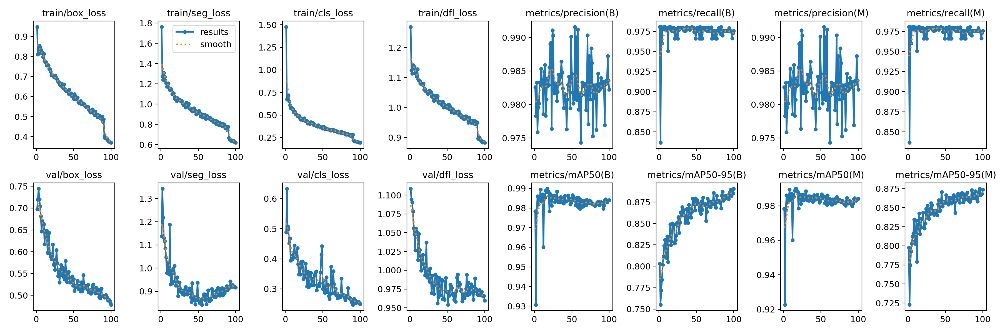

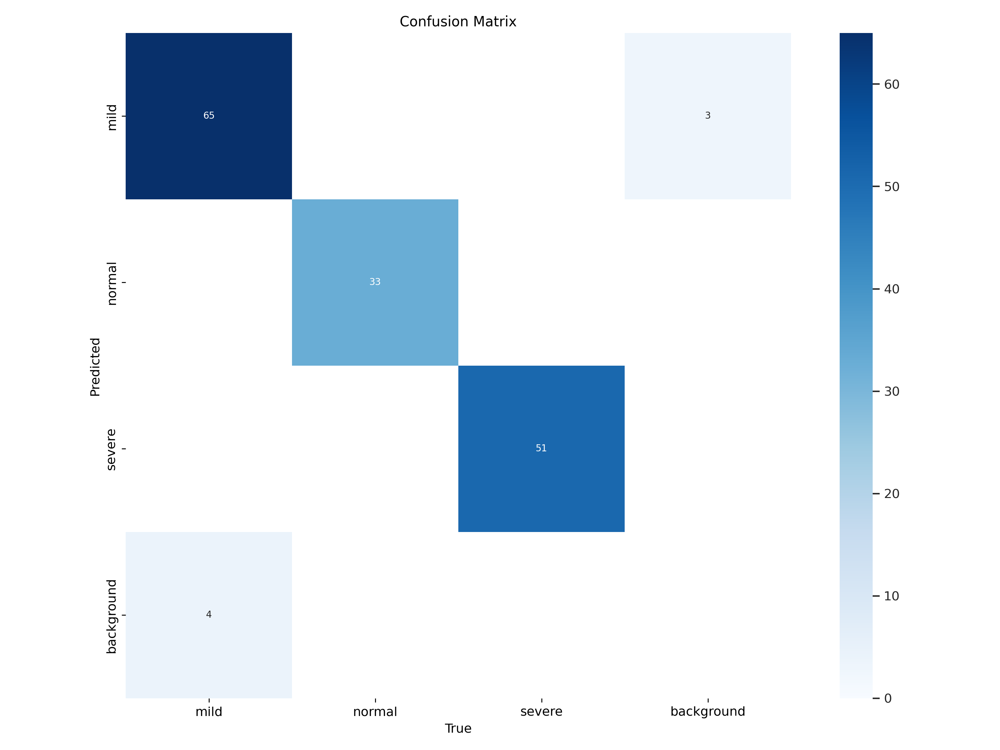

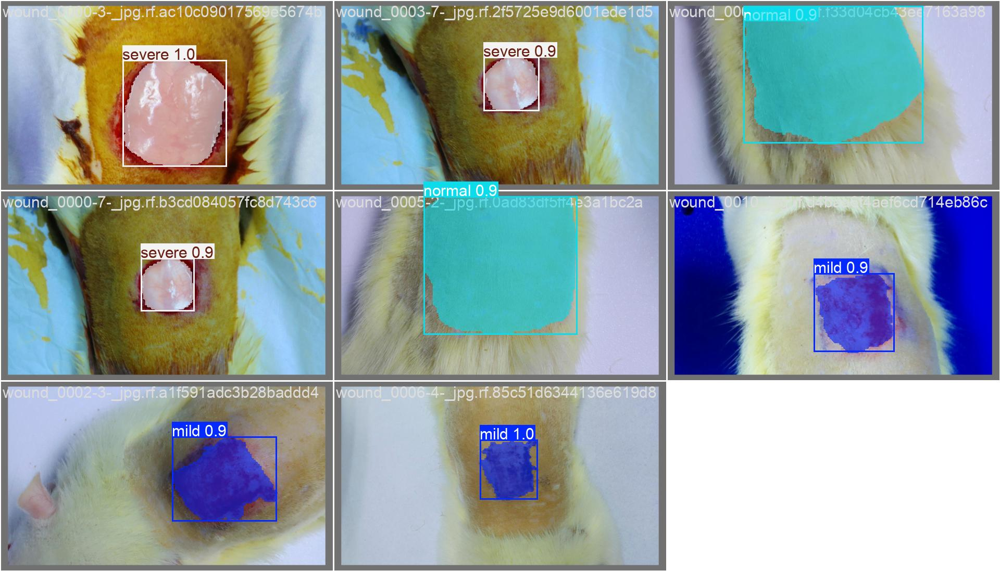

In [ ]:
# 4th Section: Final Visualization
%cd {HOME}

# Change this to 'original_yolov8s_seg5' to match your training output folder
RUN_NAME = 'original_yolov8s_seg5'

# Loss Curves
display(Image(filename=f'{HOME}/runs/segment/{RUN_NAME}/results.png', width=600))

# Confusion Matrix
display(Image(filename=f'{HOME}/runs/segment/{RUN_NAME}/confusion_matrix.png', width=600))

# Sample Test Predictions
display(Image(filename=f'{HOME}/runs/segment/{RUN_NAME}/val_batch0_pred.jpg', width=600))

# Mask Segmentation Output From Wound


image 1/1 /content/wound-4/test/images/wound_0000_jpg.rf.70f6449aecd8f49a9731165bfe31a2e2.jpg: 384x640 1 severe, 105.0ms
Speed: 4.9ms preprocess, 105.0ms inference, 9.7ms postprocess per image at shape (1, 3, 384, 640)


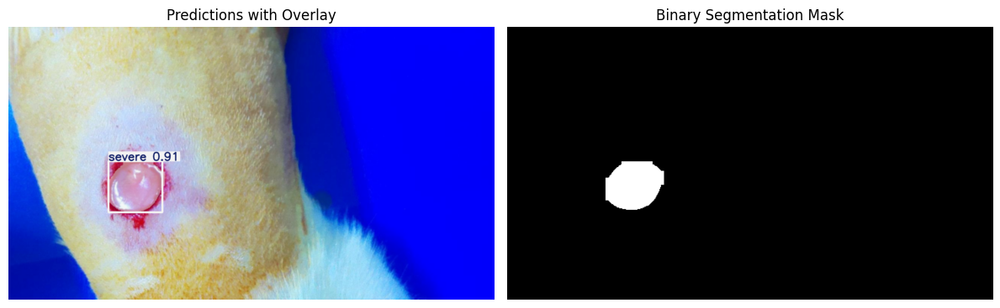


image 1/1 /content/wound-4/test/images/wound_0002-2-_jpg.rf.5cc2bafa673c92432aa204dfa4dcdfb9.jpg: 384x640 1 mild, 22.0ms
Speed: 9.2ms preprocess, 22.0ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)


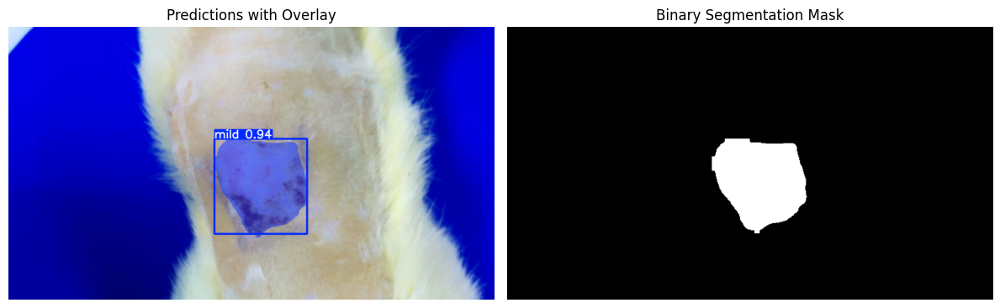


image 1/1 /content/wound-4/test/images/wound_0002-5-_jpg.rf.3e56c86f3259729aa2a7df8b3c987e40.jpg: 384x640 1 severe, 20.3ms
Speed: 2.2ms preprocess, 20.3ms inference, 3.3ms postprocess per image at shape (1, 3, 384, 640)


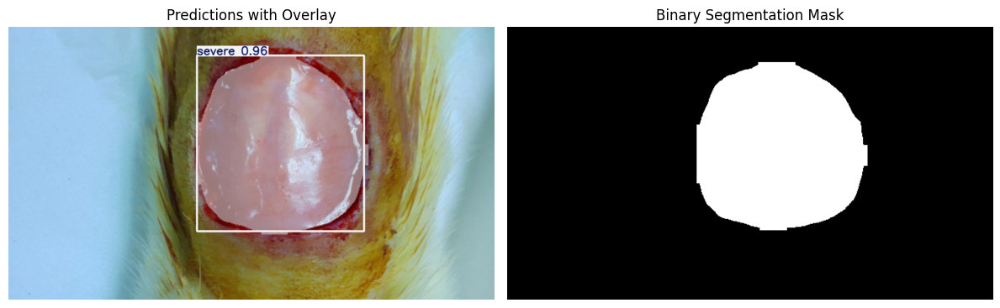


image 1/1 /content/wound-4/test/images/wound_0003-4-_jpg.rf.d40ff4e79212aeb6360c8d9dccca39f2.jpg: 384x640 1 severe, 20.2ms
Speed: 2.1ms preprocess, 20.2ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 640)


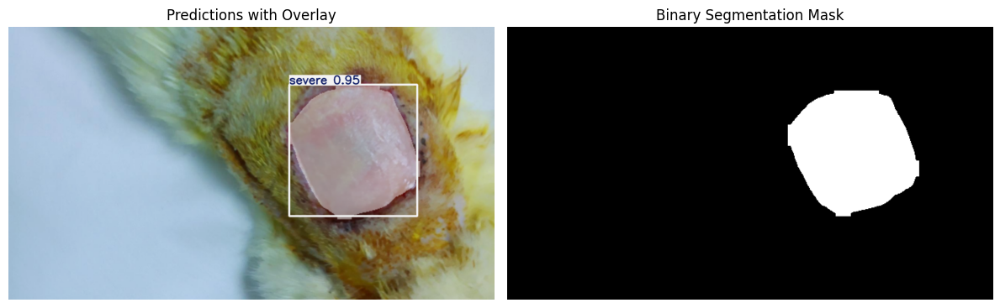


image 1/1 /content/wound-4/test/images/wound_0004-2-_jpg.rf.4fdc71e614537e74c88da211fea0fbe7.jpg: 384x640 1 severe, 20.1ms
Speed: 2.2ms preprocess, 20.1ms inference, 4.6ms postprocess per image at shape (1, 3, 384, 640)


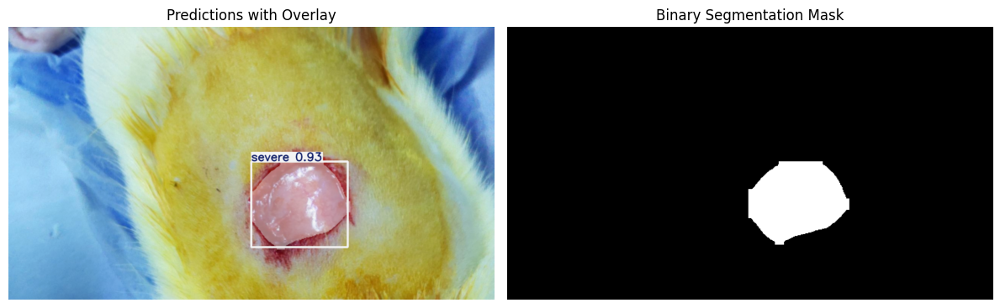


All binary masks generated. Proceeding to size calculation...



In [ ]:
import os
import cv2
import numpy as np
import glob
from ultralytics import YOLO
import matplotlib.pyplot as plt

# 1. Load your trained model
run_name = "original_yolov8s_seg5"
model = YOLO(f'runs/segment/{run_name}/weights/best.pt')

# 2. Get test images
test_images = sorted(glob.glob(f'{dataset.location}/test/images/*.jpg') + glob.glob(f'{dataset.location}/test/images/*.png'))

# --------------------------------------------------
# STEP 1: Run predictions and show binary masks
# --------------------------------------------------
results_list = []   # store results so Step 2 can reuse them
masks_list = []      # store binary masks so Step 2 can reuse them
image_names = []

for img_path in test_images[:5]:
    # Run prediction
    results = model(img_path, conf=0.25)
    r = results[0]

    # Get image with overlay (YOLO plots this natively in BGR format)
    plotted_img = r.plot()
    plotted_img_rgb = cv2.cvtColor(plotted_img, cv2.COLOR_BGR2RGB)

    # Create binary mask AT ORIGINAL RESOLUTION
    orig_shape = r.orig_shape  # (height, width)
    binary_mask = np.zeros(orig_shape, dtype=np.uint8)

    if r.masks is not None:
        masks_data = r.masks.data.cpu().numpy()
        for mask in masks_data:
            resized_mask = cv2.resize(mask, (orig_shape[1], orig_shape[0]))  # resize image to original shape
            binary_mask = np.logical_or(binary_mask, resized_mask).astype(np.uint8) * 255

    # Plot side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(plotted_img_rgb)
    axes[0].set_title("Predictions with Overlay")
    axes[0].axis('off')

    axes[1].imshow(binary_mask, cmap='gray')
    axes[1].set_title("Binary Segmentation Mask")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    # Save for Step 2
    results_list.append(r)
    masks_list.append(binary_mask)
    image_names.append(os.path.basename(img_path))

print("\nAll binary masks generated. Proceeding to size calculation...\n")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Mask Segmentation Output From Wound and show Pixel Count


image 1/1 /content/wound-4/test/images/wound_0000_jpg.rf.70f6449aecd8f49a9731165bfe31a2e2.jpg: 384x640 1 severe, 15.5ms
Speed: 2.6ms preprocess, 15.5ms inference, 5.2ms postprocess per image at shape (1, 3, 384, 640)

Image: wound_0000_jpg.rf.70f6449aecd8f49a9731165bfe31a2e2.jpg
Original image resolution: 1280 x 720
YOLO mask shape: (1, 720, 1280)
Original-resolution wound pixels: 16266


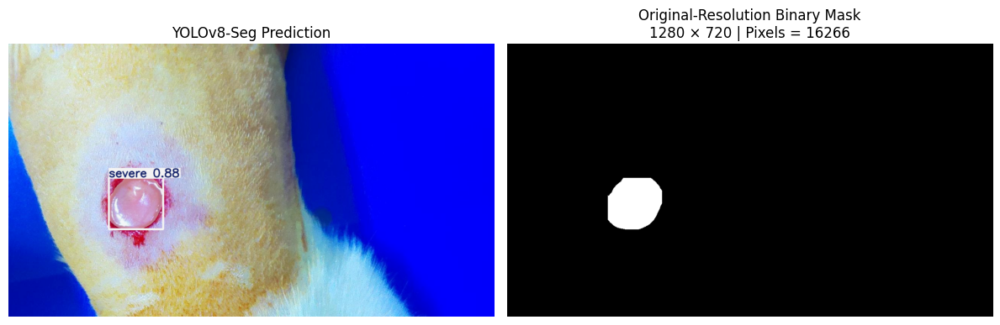


image 1/1 /content/wound-4/test/images/wound_0002-2-_jpg.rf.5cc2bafa673c92432aa204dfa4dcdfb9.jpg: 384x640 1 mild, 33.8ms
Speed: 6.5ms preprocess, 33.8ms inference, 4.7ms postprocess per image at shape (1, 3, 384, 640)

Image: wound_0002-2-_jpg.rf.5cc2bafa673c92432aa204dfa4dcdfb9.jpg
Original image resolution: 1280 x 720
YOLO mask shape: (1, 720, 1280)
Original-resolution wound pixels: 48045


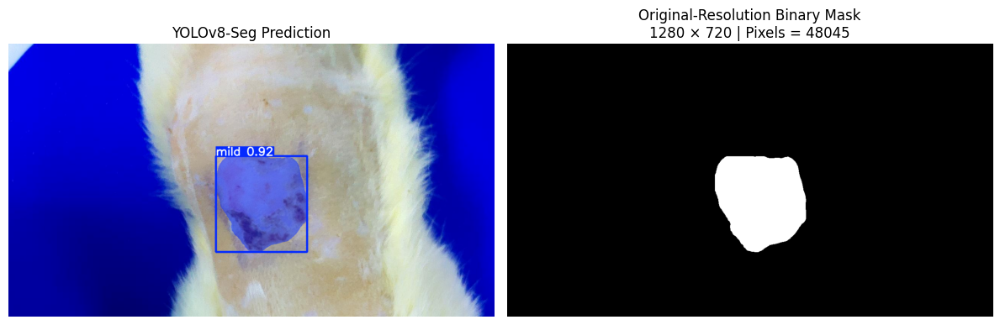


image 1/1 /content/wound-4/test/images/wound_0002-5-_jpg.rf.3e56c86f3259729aa2a7df8b3c987e40.jpg: 384x640 1 severe, 14.6ms
Speed: 2.2ms preprocess, 14.6ms inference, 5.3ms postprocess per image at shape (1, 3, 384, 640)

Image: wound_0002-5-_jpg.rf.3e56c86f3259729aa2a7df8b3c987e40.jpg
Original image resolution: 1280 x 720
YOLO mask shape: (1, 720, 1280)
Original-resolution wound pixels: 165064


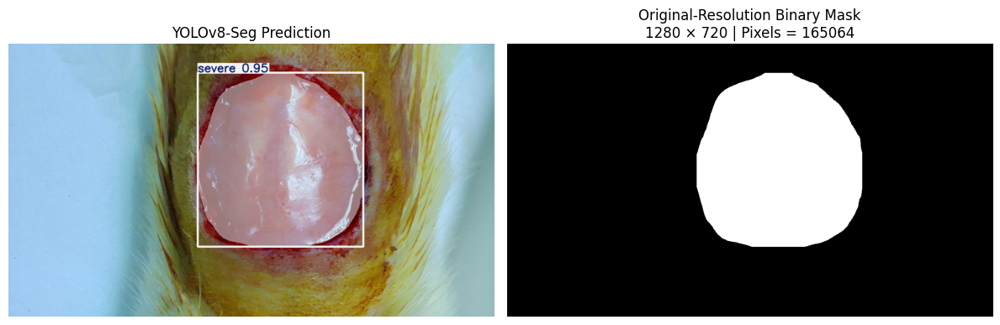


image 1/1 /content/wound-4/test/images/wound_0003-4-_jpg.rf.d40ff4e79212aeb6360c8d9dccca39f2.jpg: 384x640 1 severe, 13.8ms
Speed: 2.0ms preprocess, 13.8ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)

Image: wound_0003-4-_jpg.rf.d40ff4e79212aeb6360c8d9dccca39f2.jpg
Original image resolution: 1280 x 720
YOLO mask shape: (1, 720, 1280)
Original-resolution wound pixels: 86952


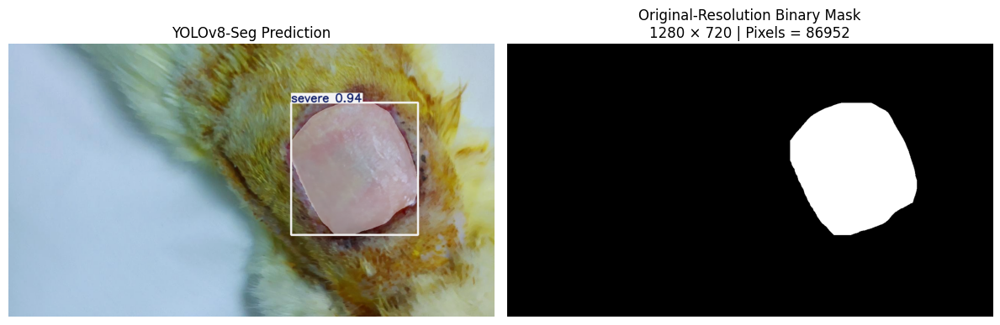


image 1/1 /content/wound-4/test/images/wound_0004-2-_jpg.rf.4fdc71e614537e74c88da211fea0fbe7.jpg: 384x640 1 severe, 13.9ms
Speed: 2.1ms preprocess, 13.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

Image: wound_0004-2-_jpg.rf.4fdc71e614537e74c88da211fea0fbe7.jpg
Original image resolution: 1280 x 720
YOLO mask shape: (1, 720, 1280)
Original-resolution wound pixels: 42374


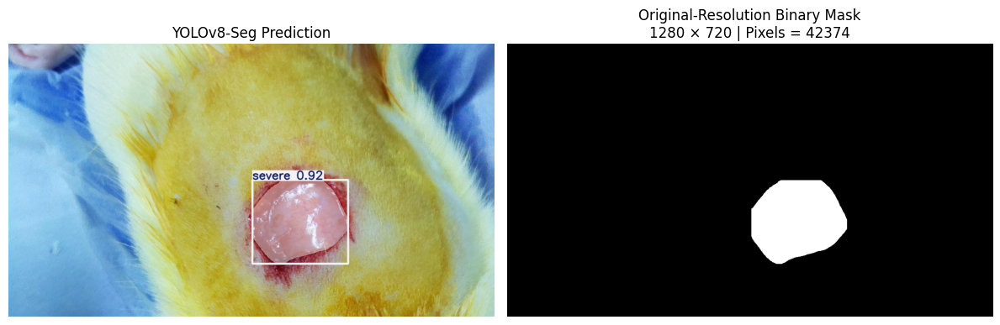

In [ ]:
import os
import cv2
import numpy as np
import glob
from ultralytics import YOLO
import matplotlib.pyplot as plt

# ============================================================
# CELL 1: YOLO SEGMENTATION + ORIGINAL-RESOLUTION BINARY MASK
# ============================================================

# 1. Load trained YOLOv8-Seg model
# 1. Load your trained model
model_path = '/content/drive/MyDrive/yoloreferpaper.pt'
model = YOLO(model_path)

# 2. Get test images
test_images = sorted(
    glob.glob(f'{dataset.location}/test/images/*.jpg') +
    glob.glob(f'{dataset.location}/test/images/*.png')
)

# Store pixel results for use in Cell 2
wound_pixel_results = []

# 3. Process first 5 test images
for img_path in test_images[:5]:

    # --------------------------------------------------------
    # YOLO inference
    # imgsz=640 = model processing resolution
    # retina_masks=True = return mask at original image size
    # --------------------------------------------------------
    results = model(
        img_path,
        imgsz=640,
        conf=0.25,
        retina_masks=True
    )

    r = results[0]

    # Original image dimensions
    orig_h, orig_w = r.orig_shape

    print("\n========================================")
    print(f"Image: {os.path.basename(img_path)}")
    print(f"Original image resolution: {orig_w} x {orig_h}")

    # YOLO prediction visualization
    plotted_img = r.plot()
    plotted_img_rgb = cv2.cvtColor(
        plotted_img,
        cv2.COLOR_BGR2RGB
    )

    # Create empty binary mask using ORIGINAL image dimensions
    binary_mask = np.zeros(
        (orig_h, orig_w),
        dtype=np.uint8
    )

    # --------------------------------------------------------
    # Process segmentation mask
    # --------------------------------------------------------
    if r.masks is not None:

        masks_data = r.masks.data.cpu().numpy()

        print(f"YOLO mask shape: {masks_data.shape}")

        # Combine all detected wound masks
        for mask in masks_data:

            # Convert to binary mask
            mask_binary = mask > 0.5

            # Add mask to combined wound mask
            binary_mask[mask_binary] = 255

        # ----------------------------------------------------
        # Count wound pixels from ORIGINAL-resolution mask
        # ----------------------------------------------------
        wound_pixels = np.count_nonzero(binary_mask)

        print(f"Original-resolution wound pixels: {wound_pixels}")

        # Save result for Cell 2
        wound_pixel_results.append({
            "image": os.path.basename(img_path),
            "width": orig_w,
            "height": orig_h,
            "wound_pixels": wound_pixels
        })

    else:

        wound_pixels = 0

        print("No wound detected.")

        wound_pixel_results.append({
            "image": os.path.basename(img_path),
            "width": orig_w,
            "height": orig_h,
            "wound_pixels": 0
        })

    # --------------------------------------------------------
    # Display prediction and binary mask
    # --------------------------------------------------------
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(plotted_img_rgb)
    axes[0].set_title("YOLOv8-Seg Prediction")
    axes[0].axis("off")

    axes[1].imshow(binary_mask, cmap="gray")
    axes[1].set_title(
        f"Original-Resolution Binary Mask\n"
        f"{orig_w} × {orig_h} | Pixels = {wound_pixels}"
    )
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
print(f"Original image resolution: {orig_w} x {orig_h}")

Original image resolution: 1280 x 720


Loading model from: /content/drive/MyDrive/yoloreferpaper2.pt

Please upload your test image:


Saving Day1-severe.jpg to Day1-severe.jpg

[DIAGNOSTIC] Raw uploaded file resolution (cv2.imread): 1280 x 720

image 1/1 /content/Day1-severe.jpg: 736x1280 1 severe, 55.1ms
Speed: 6.3ms preprocess, 55.1ms inference, 5.3ms postprocess per image at shape (1, 3, 736, 1280)
[DIAGNOSTIC] Inference orig_shape (YOLO's view): 1280 x 720
✅ Resolution matches — proceeding with area calculation.
[DIAGNOSTIC] YOLO mask shape: (1, 720, 1280)  (should be (n, 720, 1280))

Wound pixel count: 15869
Wound area: 0.8073 cm²

Prediction overlay:


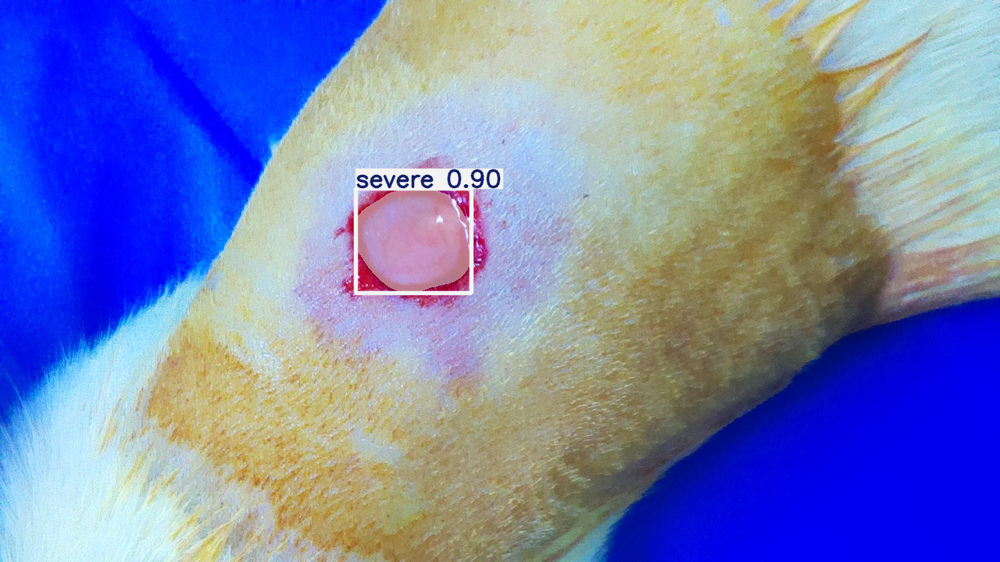


Binary mask:


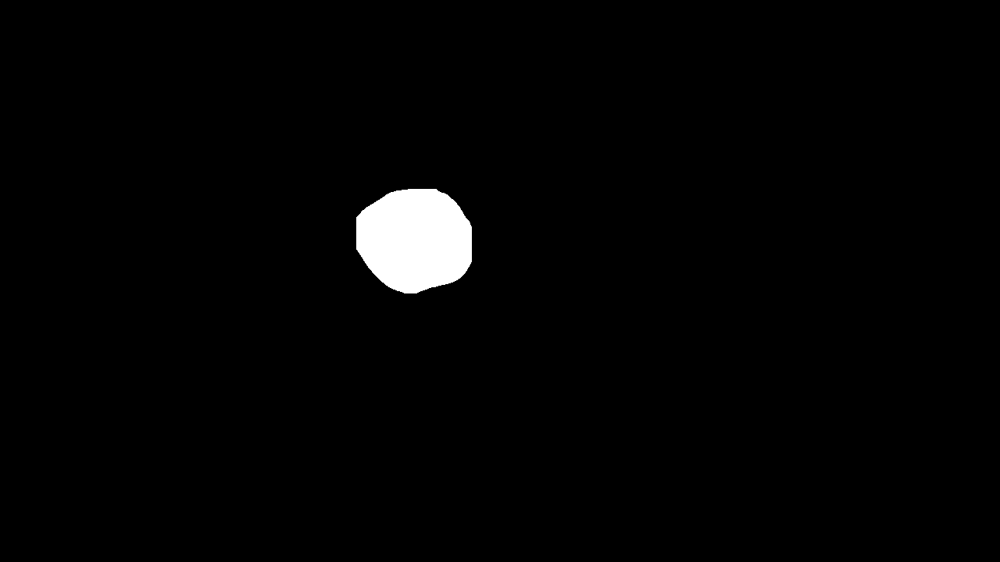

In [ ]:
import cv2
import numpy as np
from google.colab import files
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# --------------------------------------------------
# 1. Load model
# --------------------------------------------------
model_path = '/content/drive/MyDrive/yoloreferpaper2.pt'
print(f"Loading model from: {model_path}")
model = YOLO(model_path)

# --------------------------------------------------
# 2. Conversion factor
# --------------------------------------------------
AREA_CONVERSION_FACTOR = 0.00005087  # cm² per pixel----------------------------------------------------------------------------------------------

# --------------------------------------------------
# 3. Upload image
# --------------------------------------------------
print("\nPlease upload your test image:")
uploaded = files.upload()

for filename in uploaded.keys():
    img_path = filename

# --------------------------------------------------
# 4. DIAGNOSTIC: check raw file resolution before inference
# --------------------------------------------------
raw_img = cv2.imread(img_path)
raw_h, raw_w = raw_img.shape[:2]
print(f"\n[DIAGNOSTIC] Raw uploaded file resolution (cv2.imread): {raw_w} x {raw_h}")

# --------------------------------------------------
# 5. Run YOLO inference
# --------------------------------------------------
results = model(
    img_path,
    imgsz=1280,
    conf=0.25,
    retina_masks=True
)

r = results[0]
orig_h, orig_w = r.orig_shape

print(f"[DIAGNOSTIC] Inference orig_shape (YOLO's view): {orig_w} x {orig_h}")

if (raw_w, raw_h) != (orig_w, orig_h):
    print("⚠️  MISMATCH: raw file resolution != YOLO orig_shape. This is likely your bug.")
else:
    print("✅ Resolution matches — proceeding with area calculation.")

# --------------------------------------------------
# 6. Build binary mask at original resolution
# --------------------------------------------------
binary_mask = np.zeros((orig_h, orig_w), dtype=np.uint8)

if r.masks is not None:
    masks_data = r.masks.data.cpu().numpy()
    print(f"[DIAGNOSTIC] YOLO mask shape: {masks_data.shape}  (should be (n, {orig_h}, {orig_w}))")

    for mask in masks_data:
        mask_binary = mask > 0.5
        binary_mask[mask_binary] = 255

    # --------------------------------------------------
    # STEP A: Pixel count (mask only)
    # --------------------------------------------------
    wound_pixels = int(np.count_nonzero(binary_mask))
    print(f"\nWound pixel count: {wound_pixels}")

    # --------------------------------------------------
    # STEP B: cm² conversion (separate step)
    # --------------------------------------------------
    wound_area_cm2 = wound_pixels * AREA_CONVERSION_FACTOR
    print(f"Wound area: {wound_area_cm2:.4f} cm²")

else:
    print("No wound detected.")
    wound_pixels = 0
    wound_area_cm2 = 0

# --------------------------------------------------
# 7. Show prediction and mask
# --------------------------------------------------
plotted_img = r.plot()
print("\nPrediction overlay:")
cv2_imshow(plotted_img)

print("\nBinary mask:")
cv2_imshow(binary_mask)

# Test with the Testing Dataset with ratio pixel to cm




image 1/1 /content/wound-4/test/images/wound_0000_jpg.rf.70f6449aecd8f49a9731165bfe31a2e2.jpg: 384x640 1 severe, 14.7ms
Speed: 2.1ms preprocess, 14.7ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


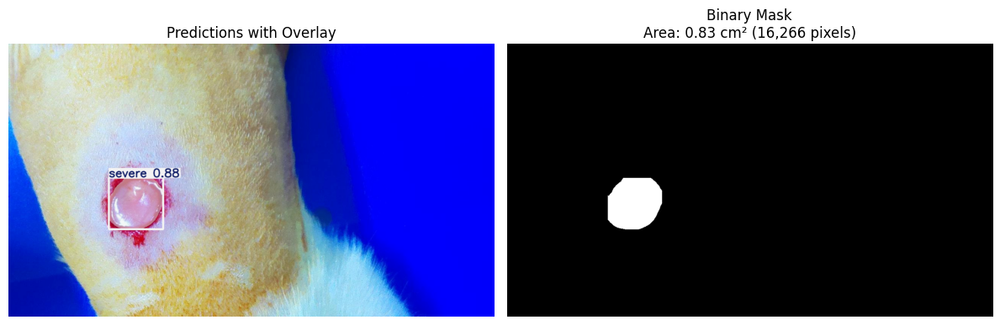

File: wound_0000_jpg.rf.70f6449aecd8f49a9731165bfe31a2e2.jpg ---> Pixels: 16,266 | Area: 0.83 cm²

image 1/1 /content/wound-4/test/images/wound_0002-2-_jpg.rf.5cc2bafa673c92432aa204dfa4dcdfb9.jpg: 384x640 1 mild, 23.6ms
Speed: 5.3ms preprocess, 23.6ms inference, 7.4ms postprocess per image at shape (1, 3, 384, 640)


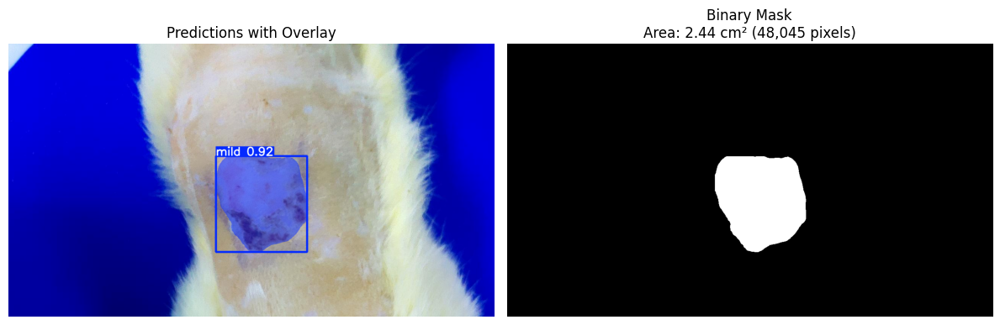

File: wound_0002-2-_jpg.rf.5cc2bafa673c92432aa204dfa4dcdfb9.jpg ---> Pixels: 48,045 | Area: 2.44 cm²

image 1/1 /content/wound-4/test/images/wound_0002-5-_jpg.rf.3e56c86f3259729aa2a7df8b3c987e40.jpg: 384x640 1 severe, 13.9ms
Speed: 2.3ms preprocess, 13.9ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)


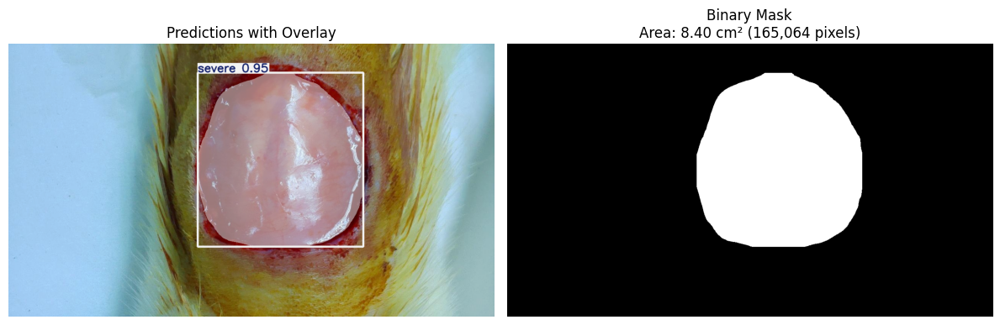

File: wound_0002-5-_jpg.rf.3e56c86f3259729aa2a7df8b3c987e40.jpg ---> Pixels: 165,064 | Area: 8.40 cm²

image 1/1 /content/wound-4/test/images/wound_0003-4-_jpg.rf.d40ff4e79212aeb6360c8d9dccca39f2.jpg: 384x640 1 severe, 14.4ms
Speed: 2.3ms preprocess, 14.4ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


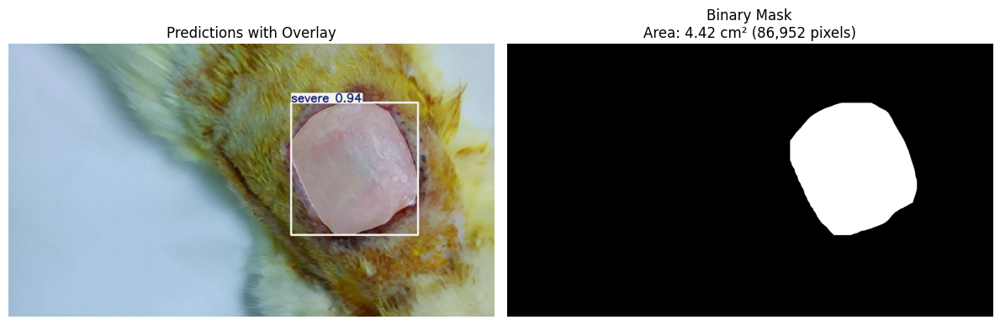

File: wound_0003-4-_jpg.rf.d40ff4e79212aeb6360c8d9dccca39f2.jpg ---> Pixels: 86,952 | Area: 4.42 cm²

image 1/1 /content/wound-4/test/images/wound_0004-2-_jpg.rf.4fdc71e614537e74c88da211fea0fbe7.jpg: 384x640 1 severe, 13.8ms
Speed: 2.1ms preprocess, 13.8ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


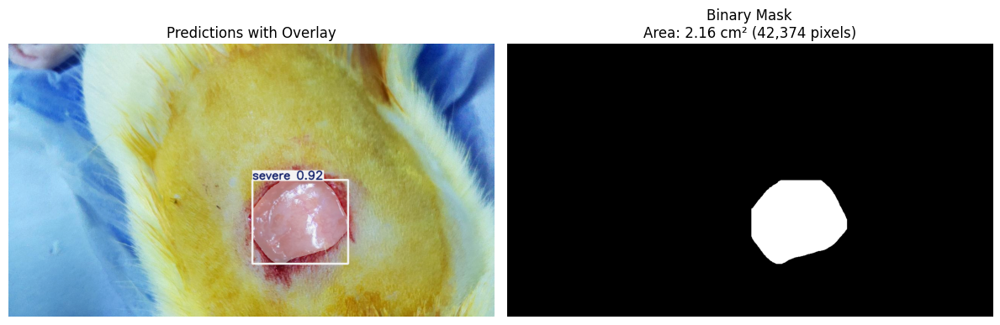

File: wound_0004-2-_jpg.rf.4fdc71e614537e74c88da211fea0fbe7.jpg ---> Pixels: 42,374 | Area: 2.16 cm²


In [ ]:
import os
import cv2
import numpy as np
import glob
from ultralytics import YOLO
import matplotlib.pyplot as plt

# ============================================================
# CELL 2: YOLO SEGMENTATION + AREA CALCULATION
# (uses the same retina_masks=True method as Cell 1, so
#  pixel counts match exactly — no manual cv2.resize used)
# ============================================================

# 1. Load trained YOLOv8-Seg model (same model as Cell 1)
model_path = '/content/drive/MyDrive/yoloreferpaper.pt'
model = YOLO(model_path)

# 2. Get test images
test_images = sorted(
    glob.glob(f'{dataset.location}/test/images/*.jpg') +
    glob.glob(f'{dataset.location}/test/images/*.png')
)

# 3. Calibrated conversion factor
AREA_CONVERSION_FACTOR = 0.00005087  # cm² per pixel

# 4. Process first 5 test images
for img_path in test_images[:5]:

    # Same inference settings as Cell 1 — retina_masks=True gives
    # masks natively at original resolution, no manual resize needed
    results = model(
        img_path,
        imgsz=640,
        conf=0.25,
        retina_masks=True
    )

    r = results[0]
    orig_h, orig_w = r.orig_shape

    # YOLO prediction visualization
    plotted_img = r.plot()
    plotted_img_rgb = cv2.cvtColor(plotted_img, cv2.COLOR_BGR2RGB)

    # Build binary mask directly from retina_masks output (no cv2.resize)
    binary_mask = np.zeros((orig_h, orig_w), dtype=np.uint8)

    if r.masks is not None:
        masks_data = r.masks.data.cpu().numpy()
        for mask in masks_data:
            mask_binary = mask > 0.5
            binary_mask[mask_binary] = 255

        wound_pixels = np.count_nonzero(binary_mask)
    else:
        wound_pixels = 0

    # Area calculation
    wound_area_cm2 = wound_pixels * AREA_CONVERSION_FACTOR

    # Display prediction + binary mask side by side
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(plotted_img_rgb)
    axes[0].set_title("Predictions with Overlay")
    axes[0].axis("off")

    axes[1].imshow(binary_mask, cmap="gray")
    axes[1].set_title(f"Binary Mask\nArea: {wound_area_cm2:.2f} cm² ({wound_pixels:,} pixels)")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    print(f"File: {os.path.basename(img_path)} ---> Pixels: {wound_pixels:,} | Area: {wound_area_cm2:.2f} cm²")

# Test with upload image

Please upload your test wound image:


Saving Day1-severe.jpg to Day1-severe (4).jpg

=== MEASUREMENT (1) ===
Classification  : SEVERE
Confidence      : 0.89
Estimated Area  : 0.82 cm²


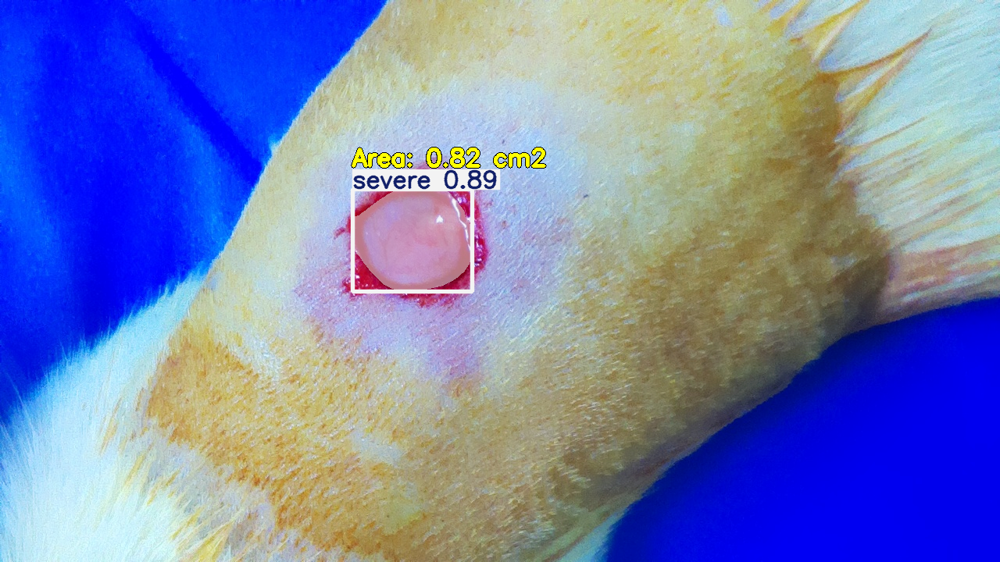


File: Day1-severe (4).jpg | Class(es): severe | Pixels: 16,058 | Area: 0.82 cm²


In [ ]:
import cv2
import numpy as np
from google.colab import files
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# 1. Load your trained model from Google Drive
model = YOLO('/content/drive/MyDrive/yoloreferpaper.pt')

# 2. Your calibrated conversion factor for Area
AREA_CONVERSION_FACTOR = 0.00005087  # cm² per pixel

# 3. Class names (confirmed from data.yaml)
custom_names = {
    0: 'mild',
    1: 'normal',
    2: 'severe'
}

# 4. Upload your test wound image from your laptop
print("Please upload your test wound image:")
uploaded = files.upload()
for fn in uploaded.keys():
    image_path = fn

# 5. Run inference directly on the ORIGINAL image
results = model.predict(
    source=image_path,
    imgsz=640,
    conf=0.25,
    retina_masks=True,
    verbose=False
)

# Track totals for the final summary line
detected_classes = []
total_pixels = 0
total_area_cm2 = 0.0

for r in results:
    annotated_img = r.plot()

    if r.masks is not None:
        classes_dict = r.names if r.names else custom_names

        for i, mask_data in enumerate(r.masks.data):
            cls_id = int(r.boxes.cls[i].item())
            class_name = classes_dict.get(cls_id, custom_names.get(cls_id, f"unknown_{cls_id}"))
            conf = r.boxes.conf[i].item()

            box = r.boxes.xyxy[i].cpu().numpy()
            x_start = int(box[0])
            y_start = int(box[1])

            mask_np = mask_data.cpu().numpy()
            mask_pixel_count = int(np.sum(mask_np > 0.5))
            area_cm2 = mask_pixel_count * AREA_CONVERSION_FACTOR

            # Track for summary line
            detected_classes.append(class_name)
            total_pixels += mask_pixel_count
            total_area_cm2 += area_cm2

            area_text = f"Area: {area_cm2:.2f} cm2"

            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 1.0
            thickness = 3

            text_x = x_start
            text_y_area = max(y_start - 30, 40)

            outline_thickness = thickness + 2
            cv2.putText(annotated_img, area_text, (text_x, text_y_area), font, font_scale, (0, 0, 0), outline_thickness)
            cv2.putText(annotated_img, area_text, (text_x, text_y_area), font, font_scale, (0, 255, 255), thickness)

            print(f"\n=== MEASUREMENT ({i+1}) ===")
            print(f"Classification  : {class_name.upper()}")
            print(f"Confidence      : {conf:.2f}")
            print(f"Estimated Area  : {area_cm2:.2f} cm²")

    else:
        print("\nNo wound detected in this image.")

# 6. Display the final annotated image
cv2_imshow(annotated_img)

# 7. Final one-line summary (matches your requested format)
severity_summary = ", ".join(detected_classes) if detected_classes else "none"
print(f"\nFile: {image_path} | Class(es): {severity_summary} | Pixels: {total_pixels:,} | Area: {total_area_cm2:.2f} cm²")

Please upload your test wound image:


Saving m06-DAY3.jpg to m06-DAY3.jpg

=== MEASUREMENT (1) ===
Classification  : MILD
Confidence      : 0.92
Estimated Area  : 2.14 cm²


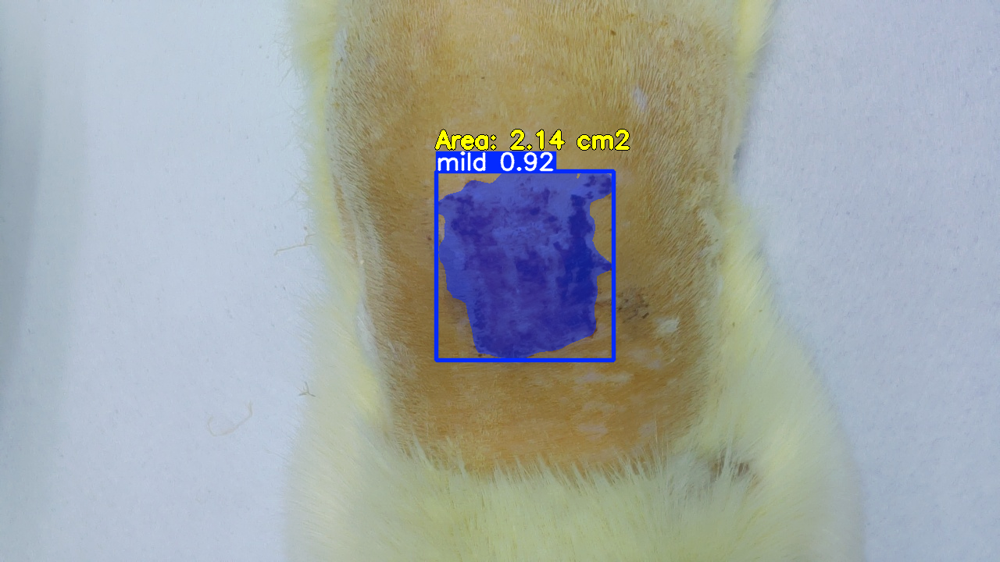


File: m06-DAY3.jpg | Class(es): mild | Pixels: 42,027 | Area: 2.14 cm²


In [ ]:
import cv2
import numpy as np
from google.colab import files
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# 1. Load your trained model from Google Drive
model = YOLO('/content/drive/MyDrive/yoloreferpaper.pt')

# 2. Your calibrated conversion factor for Area
AREA_CONVERSION_FACTOR = 0.00005087  # cm² per pixel

# 3. Class names (confirmed from data.yaml)
custom_names = {
    0: 'mild',
    1: 'normal',
    2: 'severe'
}

# 4. Upload your test wound image from your laptop
print("Please upload your test wound image:")
uploaded = files.upload()
for fn in uploaded.keys():
    image_path = fn

# 5. Run inference directly on the ORIGINAL image
results = model.predict(
    source=image_path,
    imgsz=640,
    conf=0.25,
    retina_masks=True,
    verbose=False
)

# Track totals for the final summary line
detected_classes = []
total_pixels = 0
total_area_cm2 = 0.0

for r in results:
    annotated_img = r.plot()

    if r.masks is not None:
        classes_dict = r.names if r.names else custom_names

        for i, mask_data in enumerate(r.masks.data):
            cls_id = int(r.boxes.cls[i].item())
            class_name = classes_dict.get(cls_id, custom_names.get(cls_id, f"unknown_{cls_id}"))
            conf = r.boxes.conf[i].item()

            box = r.boxes.xyxy[i].cpu().numpy()
            x_start = int(box[0])
            y_start = int(box[1])

            mask_np = mask_data.cpu().numpy()
            mask_pixel_count = int(np.sum(mask_np > 0.5))
            area_cm2 = mask_pixel_count * AREA_CONVERSION_FACTOR

            # Track for summary line
            detected_classes.append(class_name)
            total_pixels += mask_pixel_count
            total_area_cm2 += area_cm2

            area_text = f"Area: {area_cm2:.2f} cm2"

            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 1.0
            thickness = 3

            text_x = x_start
            text_y_area = max(y_start - 30, 40)

            outline_thickness = thickness + 2
            cv2.putText(annotated_img, area_text, (text_x, text_y_area), font, font_scale, (0, 0, 0), outline_thickness)
            cv2.putText(annotated_img, area_text, (text_x, text_y_area), font, font_scale, (0, 255, 255), thickness)

            print(f"\n=== MEASUREMENT ({i+1}) ===")
            print(f"Classification  : {class_name.upper()}")
            print(f"Confidence      : {conf:.2f}")
            print(f"Estimated Area  : {area_cm2:.2f} cm²")

    else:
        print("\nNo wound detected in this image.")

# 6. Display the final annotated image
cv2_imshow(annotated_img)

# 7. Final one-line summary (matches your requested format)
severity_summary = ", ".join(detected_classes) if detected_classes else "none"
print(f"\nFile: {image_path} | Class(es): {severity_summary} | Pixels: {total_pixels:,} | Area: {total_area_cm2:.2f} cm²")

Please upload your test wound image(s):


Saving wound_0010.jpg to wound_0010.jpg

PROCESSING: wound_0010.jpg

=== MEASUREMENT (1) ===
Classification  : NORMAL
Confidence      : 0.82
Estimated Area  : 18.50 cm²


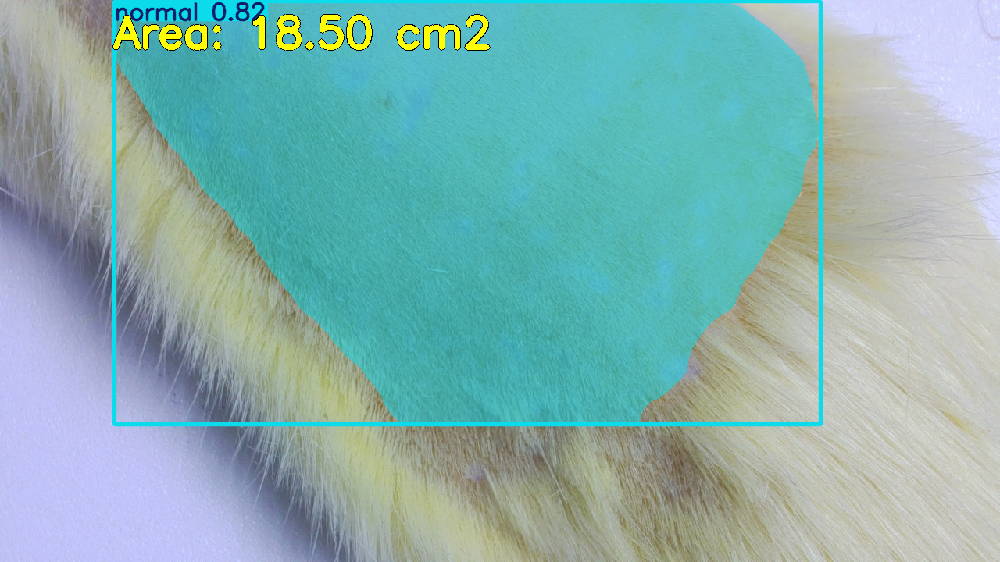


File: wound_0010.jpg | Class(es): normal | Pixels: 363,690 | Area: 18.50 cm²


In [ ]:
import cv2
import numpy as np
from google.colab import files
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# 1. Load your trained model from Google Drive
model = YOLO('/content/drive/MyDrive/yoloreferpaper.pt')

# 2. Your calibrated conversion factor for Area
AREA_CONVERSION_FACTOR = 0.00005087  # cm² per pixel

# 3. Class names (confirmed from data.yaml)
custom_names = {
    0: 'mild',
    1: 'normal',
    2: 'severe'
}

# 4. Upload your test wound images from your laptop
print("Please upload your test wound image(s):")
uploaded = files.upload()

# Process every uploaded image individually
for fn in uploaded.keys():
    image_path = fn
    print(f"\n==========================================")
    print(f"PROCESSING: {image_path}")
    print(f"==========================================")

    # 5. Run inference directly on the ORIGINAL image
    results = model.predict(
        source=image_path,
        imgsz=640,
        conf=0.25,
        retina_masks=True,
        verbose=False
    )

    # Track totals per image for the summary line
    detected_classes = []
    total_pixels = 0
    total_area_cm2 = 0.0

    for r in results:
        annotated_img = r.plot()

        if r.masks is not None:
            classes_dict = r.names if r.names else custom_names

            for i, mask_data in enumerate(r.masks.data):
                cls_id = int(r.boxes.cls[i].item())
                class_name = classes_dict.get(cls_id, custom_names.get(cls_id, f"unknown_{cls_id}"))
                conf = r.boxes.conf[i].item()
                box = r.boxes.xyxy[i].cpu().numpy()
                x_start = int(box[0])
                y_start = int(box[1])

                mask_np = mask_data.cpu().numpy()
                mask_pixel_count = int(np.sum(mask_np > 0.5))
                area_cm2 = mask_pixel_count * AREA_CONVERSION_FACTOR

                # Accumulate values
                detected_classes.append(class_name)
                total_pixels += mask_pixel_count
                total_area_cm2 += area_cm2

                # Text overlay with increased size
                area_text = f"Area: {area_cm2:.2f} cm2"
                font = cv2.FONT_HERSHEY_SIMPLEX
                font_scale = 1.8
                thickness = 5
                text_x = x_start
                text_y_area = max(y_start - 40, 60)
                outline_thickness = thickness + 2

                cv2.putText(annotated_img, area_text, (text_x, text_y_area), font, font_scale, (0, 0, 0), outline_thickness)
                cv2.putText(annotated_img, area_text, (text_x, text_y_area), font, font_scale, (0, 255, 255), thickness)

                print(f"\n=== MEASUREMENT ({i+1}) ===")
                print(f"Classification  : {class_name.upper()}")
                print(f"Confidence      : {conf:.2f}")
                print(f"Estimated Area  : {area_cm2:.2f} cm²")
        else:
            print("\nNo wound detected in this image.")

        # 6. Display annotated image for current file
        cv2_imshow(annotated_img)

    # 7. Print final summary line per image
    severity_summary = ", ".join(detected_classes) if detected_classes else "none"
    print(f"\nFile: {image_path} | Class(es): {severity_summary} | Pixels: {total_pixels:,} | Area: {total_area_cm2:.2f} cm²")

# Convert to ONXX FILE

In [ ]:
!pip install onnxscript -q

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Check model

In [ ]:
from ultralytics import YOLO

# 1. Load your latest trained model directly from Google Drive
model_path = '/content/drive/MyDrive/yoloreferpaperlatest.pt'
print(f"Loading latest model from: {model_path}")
model = YOLO(model_path)

# 2. Export to ONNX format
print("\nExporting model to ONNX...")
onnx_path = model.export(format='onnx', imgsz=640)
print(f"ONNX export successful: {onnx_path}")

# 3. Export to NCNN format
print("\nExporting model to NCNN...")
ncnn_path = model.export(format='ncnn', imgsz=640)
print(f"NCNN export successful: {ncnn_path}")

print("\nAll exports completed successfully!")

Loading latest model from: /content/drive/MyDrive/yoloreferpaperlatest.pt

Exporting model to ONNX...
Ultralytics YOLOv8.2.103 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon 2.00GHz)
YOLOv8s-seg summary (fused): 195 layers, 11,780,761 parameters, 0 gradients, 39.9 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/yoloreferpaperlatest.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 39, 8400), (1, 32, 160, 160)) (22.7 MB)

ONNX: starting export with onnx 1.22.0 opset 10...


W0820 12:09:56.107000 3583 torch/onnx/_internal/exporter/_compat.py:133] Setting ONNX exporter to use operator set version 18 because the requested opset_version 10 is a lower version than we have implementations for. Automatic version conversion will be performed, which may not be successful at converting to the requested version. If version conversion is unsuccessful, the opset version of the exported model will be kept at 18. Please consider setting opset_version >=18 to leverage latest ONNX features
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter/__init__.py", line 137, in call
    converted_proto = _c_api_utils.call_onnx_api(
                      ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter/_c_api_utils.py", line 65, in call_onnx_api
    result = func(proto)
             ^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter

ONNX: slimming with onnxslim 0.1.34...
ONNX: export success ✅ 14.1s, saved as '/content/drive/MyDrive/yoloreferpaperlatest.onnx' (45.1 MB)

Export complete (15.8s)
Results saved to /content/drive/MyDrive
Predict:         yolo predict task=segment model=/content/drive/MyDrive/yoloreferpaperlatest.onnx imgsz=640  
Validate:        yolo val task=segment model=/content/drive/MyDrive/yoloreferpaperlatest.onnx imgsz=640 data=/content/wound-4/data.yaml  
Visualize:       https://netron.app
ONNX export successful: /content/drive/MyDrive/yoloreferpaperlatest.onnx

Exporting model to NCNN...
Ultralytics YOLOv8.2.103 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon 2.00GHz)
YOLOv8s-seg summary (fused): 195 layers, 11,780,761 parameters, 0 gradients, 39.9 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/yoloreferpaperlatest.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 39, 8400), (1, 32, 160, 160)) (22.7 MB)

TorchScript: starting export with torch 2.11.0+cu128...
To

100%|██████████| 27.2M/27.2M [00:00<00:00, 149MB/s]
Unzipping pnnx-20260704-linux.zip to /content/pnnx-20260704-linux...: 100%|██████████| 3/3 [00:00<00:00,  5.04file/s]

NCNN: running '/usr/local/lib/python3.12/dist-packages/ultralytics/pnnx /content/drive/MyDrive/yoloreferpaperlatest.torchscript ncnnparam=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model/model.ncnn.param ncnnbin=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model/model.ncnn.bin ncnnpy=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model/model_ncnn.py pnnxparam=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model/model.pnnx.param pnnxbin=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model/model.pnnx.bin pnnxpy=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model/model_pnnx.py pnnxonnx=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model/model.pnnx.onnx fp16=0 device=cpu inputshape="[1, 3, 640, 640]"'


NCNN: export success ✅ 12.1s, saved as '/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model' (45.1 MB)

Export complete (19.0s)
Results saved to /content/drive/MyDrive
Predict:         yolo predict task=segment model=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model imgsz=640  
Validate:        yolo val task=segment model=/content/drive/MyDrive/yoloreferpaperlatest_ncnn_model imgsz=640 data=/content/wound-4/data.yaml  
Visualize:       https://netron.app
NCNN export successful: /content/drive/MyDrive/yoloreferpaperlatest_ncnn_model

All exports completed successfully!


In [ ]:
import glob
from ultralytics import YOLO

# --- Test ONNX Model ---
print("=== TESTING ONNX MODEL ===")
onnx_model = YOLO('/content/drive/MyDrive/yoloreferpaperlatest.onnx', task='segment')

test_images = sorted(glob.glob(f'{dataset.location}/test/images/*.jpg') + glob.glob(f'{dataset.location}/test/images/*.png'))
test_img_path = test_images[0]
onnx_results = onnx_model(test_img_path, conf=0.25, verbose=False)

print("model.model:", type(onnx_model.model), onnx_model.model)
print("model.predictor:", onnx_model.predictor)
if onnx_model.predictor is not None:
    print("model.predictor.model:", type(onnx_model.predictor.model))
    print("has names:", hasattr(onnx_model.predictor.model, 'names'))
print("onnx_results[0].names:", onnx_results[0].names)
print("\nONNX Verification Completed Successfully!")

=== TESTING ONNX MODEL ===
Loading /content/drive/MyDrive/yoloreferpaperlatest.onnx for ONNX Runtime inference...
model.model: <class 'str'> /content/drive/MyDrive/yoloreferpaperlatest.onnx
model.predictor: <ultralytics.models.yolo.segment.predict.SegmentationPredictor object at 0x7c75ee7b5e50>
model.predictor.model: <class 'ultralytics.nn.autobackend.AutoBackend'>
has names: True
onnx_results[0].names: {0: 'mild', 1: 'normal', 2: 'severe'}

ONNX Verification Completed Successfully!


In [ ]:
#That crash happens because NCNN runtime libraries have compatibility issues inside Google Colab's standard Python 3.12 environment